In [1]:
import wandb

In [2]:
wandb.login()

True

In [3]:
wandb.init(project="lorenz_lstm", group="Lorenz",save_code=True,notes="Lorenz LSTM run and evaluation")

In [4]:
from torchdiffeq import odeint
import torch
import torch.nn as nn
import torch.optim as optim
from torch.nn import functional as F
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import clear_output
import seaborn as sns

In [5]:
def visualize(real=None, train=None, save=None, title=''):
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(1, 1, 1, projection='3d')
    
    ax.set_title('Lorenz Attractor \n'+title)

    if train is not None:
      sns.set(style='darkgrid')
      
      z = np.array([o.detach().numpy() for o in train])
      z = np.reshape(z, [-1,3])
      sc = ax.scatter(z[:,0], z[:,1], z[:,2], c=z[:,2], cmap='Greens', s=1)
      #cbar = fig.colorbar(sc)

    if real is not None:
      #sns.set(style='darkgrid')
      
      z = np.array([o.detach().numpy() for o in real])
      z = np.reshape(z, [-1,3])
      ax.scatter(z[:,0], z[:,1], z[:,2], marker='.', color='k', alpha=0.5, linewidths=0, s=45)
      #sc = ax.scatter(z[:,0], z[:,1], z[:,2], c=z[:,2], cmap='Reds', s=1)
      #cbar = fig.colorbar(sc)
      #ax.scatter(, marker='.', c=c,cmap='viridis', alpha=0.5, linewidths=0, s=45)

    fig.canvas.draw()
    fig.canvas.flush_events()
    if save is not None:
        plt.savefig(save+'.png', format='png', dpi=400, bbox_inches ='tight', pad_inches = 0.1)
    plt.show()

In [6]:
class Lorenz(nn.Module):
    """
    chaotic lorenz system
    """
    def __init__(self):
        super(Lorenz, self).__init__()
        self.lin = nn.Linear(5, 3, bias=False)
        W = torch.tensor([[-10., 10., 0., 0., 0.],
                          [28., -1., 0., -1., 0.],
                          [0., 0., -8. / 3., 0., 1.]])
        self.lin.weight = nn.Parameter(W)

    def forward(self, t, x):
        y = y = torch.ones([1, 5])
        y[0][0] = x[0][0]
        y[0][1] = x[0][1]
        y[0][2] = x[0][2]
        y[0][3] = x[0][0] * x[0][2]
        y[0][4] = x[0][0] * x[0][1]
        return self.lin(y)

true_y0 = torch.tensor([[0.5, 0.5, 20.]])  # initial condition
t = torch.linspace(0., 25., 5000)  # t is from 0 to 25 for 1000 data points

# generating training data
with torch.no_grad():
    data = odeint(Lorenz(), true_y0, t)

In [7]:
visualize(real=data,save='real',title='Real Data')

In [8]:
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        # Initialize hidden state with zeros
        h0 = torch.zeros(1, x.size(0), self.lstm.hidden_size).to(x.device)
        c0 = torch.zeros(1, x.size(0), self.lstm.hidden_size).to(x.device)

        # Forward pass through LSTM layer
        out, _ = self.lstm(x, (h0, c0))

        # Reshape output for the fully connected layer
        out = out[:, -1, :]

        # Fully connected layer
        out = self.fc(out)

        return out

# Define input size, hidden size, and output size
input_size = 3
hidden_size = 16
output_size = 3

# Create an instance of the LSTMModel
lstm_model = LSTMModel(input_size, hidden_size, output_size)

# Define loss function and optimizer
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(lstm_model.parameters())

# Print the model architecture
print(lstm_model)

In [9]:
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        # Initialize hidden state with zeros
        h0 = torch.zeros(1, x.size(0), self.lstm.hidden_size).to(x.device)
        c0 = torch.zeros(1, x.size(0), self.lstm.hidden_size).to(x.device)

        # Forward pass through LSTM layer
        out, _ = self.lstm(x, (h0, c0))

        # Reshape output for the fully connected layer
        out = out[:, -1, :]

        # Fully connected layer
        out = self.fc(out)

        return out

# Define input size, hidden size, and output size
input_size = 3
hidden_size = 512
output_size = 3

# Create an instance of the LSTMModel
lstm_model = LSTMModel(input_size, hidden_size, output_size)

# Define loss function and optimizer
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(lstm_model.parameters())

# Print the model architecture
print(lstm_model)

In [10]:
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        # Initialize hidden state with zeros
        h0 = torch.zeros(1, x.size(0), self.lstm.hidden_size).to(x.device)
        c0 = torch.zeros(1, x.size(0), self.lstm.hidden_size).to(x.device)

        # Forward pass through LSTM layer
        out, _ = self.lstm(x, (h0, c0))

        # Reshape output for the fully connected layer
        out = out[:, -1, :]

        # Fully connected layer
        out = self.fc(out)

        return out

# Define input size, hidden size, and output size
input_size = 3
hidden_size = 512
output_size = 3

# Create an instance of the LSTMModel
lstm_model = LSTMModel(input_size, hidden_size, output_size)

# Define loss function and optimizer
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(lstm_model.parameters())

In [11]:
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        # Initialize hidden state with zeros
        h0 = torch.zeros(1, x.size(0), self.lstm.hidden_size).to(x.device)
        c0 = torch.zeros(1, x.size(0), self.lstm.hidden_size).to(x.device)

        # Forward pass through LSTM layer
        out, _ = self.lstm(x, (h0, c0))

        # Reshape output for the fully connected layer
        out = out[:, -1, :]

        # Fully connected layer
        out = self.fc(out)

        return out

# Define input size, hidden size, and output size
input_size = 3
hidden_size = 512
output_size = 3

# Create an instance of the LSTMModel
model = LSTMModel(input_size, hidden_size, output_size)

# Define loss function and optimizer
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters())

In [12]:
def get_batch(true_y, batch_size):
    num_samples = len(true_y)
    indices = np.random.choice(np.arange(num_samples - batch_size, dtype=np.int64), size=batch_size, replace=False)
    indices.sort()
    batch_y0 = true_y[indices]  # (batch_size, D)  # (batch_size)
    batch_y = torch.stack([true_y[indices + batch_size-1]])  # (batch_size, M, D)
    return batch_y0, batch_y.squeeze(0)

In [13]:
num_epochs = 10000
for epoch in range(num_epochs):
    optimizer.zero_grad()
    x,y = get_batch(data, batch_size=50)
    # Forward pass
    predicted_lorenz = model(x)

    # Compute the loss
    loss = criterion(predicted_lorenz, y)

    # Backpropagation
    loss.backward()
    optimizer.step()

    if epoch % 500 == 0:
        
        predictions = []
        with torch.no_grad():
            input_seq = data[0]
            for i in range(5000):
                output = model(input_seq.unsqueeze(0))
                predictions.append(output)
                input_seq = output
        predictions = torch.stack(predictions)
        loss = F.mse_loss(predictions, data)
        visualize(real=data, 
                             train=predictions,save='PNG/{}'.format(epoch),title='Epoch {}'.format(epoch))
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')
        clear_output(wait=True)

In [14]:
x,y = get_batch(data, batch_size=50)

In [15]:
x.shape

torch.Size([50, 1, 3])

In [16]:
y.shape

torch.Size([50, 1, 3])

In [17]:
predicted_lorenz = model(x)

In [18]:
predicted_lorenz.shape

torch.Size([50, 3])

In [19]:
data.shape

torch.Size([5000, 1, 3])

In [20]:
import wandb

In [21]:
wandb.login()

True

In [22]:
wandb.init(project="lorenz_lstm", group="Lorenz",save_code=True,notes="Lorenz LSTM run and evaluation")

In [23]:
from torchdiffeq import odeint
import torch
import torch.nn as nn
import torch.optim as optim
from torch.nn import functional as F
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import clear_output
import seaborn as sns

In [24]:
def visualize(real=None, train=None, save=None, title=''):
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(1, 1, 1, projection='3d')
    
    ax.set_title('Lorenz Attractor \n'+title)

    if train is not None:
      sns.set(style='darkgrid')
      
      z = np.array([o.detach().numpy() for o in train])
      z = np.reshape(z, [-1,3])
      sc = ax.scatter(z[:,0], z[:,1], z[:,2], c=z[:,2], cmap='Greens', s=1)
      #cbar = fig.colorbar(sc)

    if real is not None:
      #sns.set(style='darkgrid')
      
      z = np.array([o.detach().numpy() for o in real])
      z = np.reshape(z, [-1,3])
      ax.scatter(z[:,0], z[:,1], z[:,2], marker='.', color='k', alpha=0.5, linewidths=0, s=45)
      #sc = ax.scatter(z[:,0], z[:,1], z[:,2], c=z[:,2], cmap='Reds', s=1)
      #cbar = fig.colorbar(sc)
      #ax.scatter(, marker='.', c=c,cmap='viridis', alpha=0.5, linewidths=0, s=45)

    fig.canvas.draw()
    fig.canvas.flush_events()
    if save is not None:
        plt.savefig(save+'.png', format='png', dpi=400, bbox_inches ='tight', pad_inches = 0.1)
    plt.show()

In [25]:
class Lorenz(nn.Module):
    """
    chaotic lorenz system
    """
    def __init__(self):
        super(Lorenz, self).__init__()
        self.lin = nn.Linear(5, 3, bias=False)
        W = torch.tensor([[-10., 10., 0., 0., 0.],
                          [28., -1., 0., -1., 0.],
                          [0., 0., -8. / 3., 0., 1.]])
        self.lin.weight = nn.Parameter(W)

    def forward(self, t, x):
        y = y = torch.ones([1, 5])
        y[0][0] = x[0][0]
        y[0][1] = x[0][1]
        y[0][2] = x[0][2]
        y[0][3] = x[0][0] * x[0][2]
        y[0][4] = x[0][0] * x[0][1]
        return self.lin(y)

true_y0 = torch.tensor([[0.5, 0.5, 20.]])  # initial condition
t = torch.linspace(0., 25., 5000)  # t is from 0 to 25 for 1000 data points

# generating training data
with torch.no_grad():
    data = odeint(Lorenz(), true_y0, t)

In [26]:
visualize(real=data,save='real',title='Real Data')

In [27]:
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        # Initialize hidden state with zeros
        h0 = torch.zeros(1, x.size(0), self.lstm.hidden_size).to(x.device)
        c0 = torch.zeros(1, x.size(0), self.lstm.hidden_size).to(x.device)

        # Forward pass through LSTM layer
        out, _ = self.lstm(x, (h0, c0))

        # Reshape output for the fully connected layer
        out = out[:, -1, :]

        # Fully connected layer
        out = self.fc(out)

        return out

# Define input size, hidden size, and output size
input_size = 3
hidden_size = 512
output_size = 3

# Create an instance of the LSTMModel
model = LSTMModel(input_size, hidden_size, output_size)

# Define loss function and optimizer
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters())

In [28]:
def get_batch(true_y, batch_size):
    num_samples = len(true_y)
    indices = np.random.choice(np.arange(num_samples - batch_size, dtype=np.int64), size=batch_size, replace=False)
    indices.sort()
    batch_y0 = true_y[indices]  # (batch_size, D)  # (batch_size)
    batch_y = torch.stack([true_y[indices + batch_size-1]])  # (batch_size, M, D)
    return batch_y0, batch_y.squeeze(0)

In [29]:
num_epochs = 10000
for epoch in range(num_epochs):
    optimizer.zero_grad()
    x,y = get_batch(data, batch_size=50)
    # Forward pass
    predicted_lorenz = model(x)

    # Compute the loss
    loss = criterion(predicted_lorenz, y)

    # Backpropagation
    loss.backward()
    optimizer.step()

    if epoch % 500 == 0:
        
        predictions = []
        with torch.no_grad():
            input_seq = data[0]
            for i in range(5000):
                output = model(input_seq.unsqueeze(0))
                predictions.append(output)
                input_seq = output
        predictions = torch.stack(predictions)
        loss = F.mse_loss(predictions, data)
        visualize(real=data, 
                             train=predictions,save='PNG/{}'.format(epoch),title='Epoch {}'.format(epoch))
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')
        clear_output(wait=True)

In [30]:
predicted_lorenz = model(x)

In [31]:
predicted_lorenz.shape

torch.Size([50, 3])

In [32]:
predicted_lorenz.squeeze(0).shape

torch.Size([50, 3])

In [33]:
predicted_lorenz.unsqueeze(0).shape

torch.Size([1, 50, 3])

In [34]:
predicted_lorenz = model(x)

In [35]:
predicted_lorenz.unsqueeze(0).shape

torch.Size([1, 50, 3])

In [36]:
predicted_lorenz.squeeze(0).shape

torch.Size([50, 3])

In [37]:
predicted_lorenz = model(x)

In [38]:
predicted_lorenz.squeeze(0).shape

torch.Size([50, 3])

In [39]:
num_epochs = 1
for epoch in range(num_epochs):
    optimizer.zero_grad()
    x,y = get_batch(data, batch_size=50)
    # Forward pass
    predicted_lorenz = model(x)

    # Compute the loss
    loss = criterion(predicted_lorenz, y)

    # Backpropagation
    loss.backward()
    optimizer.step()

    if epoch % 500 == 0:
        
        predictions = []
        with torch.no_grad():
            input_seq = data[0]
            for i in range(5000):
                output = model(input_seq.unsqueeze(0))
                predictions.append(output)
                input_seq = output
        predictions = torch.stack(predictions)
        loss = F.mse_loss(predictions, data)
        visualize(real=data, 
                             train=predictions,save='PNG/LSTM/{}'.format(epoch),title='Epoch {}'.format(epoch))
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')
        clear_output(wait=True)

In [40]:
y.squeeze(0).shape

torch.Size([50, 1, 3])

In [41]:
y.unsqueeze(0).shape

torch.Size([1, 50, 1, 3])

In [42]:
y.squeeze(0).shape

torch.Size([50, 1, 3])

In [43]:
y.squeeze(0).shape

torch.Size([50, 1, 3])

In [44]:
y.squeeze(1).shape

torch.Size([50, 3])

In [45]:
def get_batch(true_y, batch_size):
    num_samples = len(true_y)
    indices = np.random.choice(np.arange(num_samples - batch_size, dtype=np.int64), size=batch_size, replace=False)
    indices.sort()
    batch_y0 = true_y[indices]  # (batch_size, D)  # (batch_size)
    batch_y = torch.stack([true_y[indices + batch_size-1]])  # (batch_size, M, D)
    return batch_y0, batch_y

In [46]:
x,y = get_batch(data, batch_size=50)

In [47]:
y.shape

torch.Size([1, 50, 1, 3])

In [48]:
def get_batch(true_y, batch_size):
    num_samples = len(true_y)
    indices = np.random.choice(np.arange(num_samples - batch_size, dtype=np.int64), size=batch_size, replace=False)
    indices.sort()
    batch_y0 = true_y[indices]  # (batch_size, D)  # (batch_size)
    batch_y = torch.stack([true_y[indices + batch_size-1]])  # (batch_size, M, D)
    return batch_y0, batch_y.squeeze(0,1)

In [49]:
x,y = get_batch(data, batch_size=50)

In [50]:
x,y = get_batch(data, batch_size=50)

In [51]:
def get_batch(true_y, batch_size):
    num_samples = len(true_y)
    indices = np.random.choice(np.arange(num_samples - batch_size, dtype=np.int64), size=batch_size, replace=False)
    indices.sort()
    batch_y0 = true_y[indices]  # (batch_size, D)  # (batch_size)
    batch_y = torch.stack([true_y[indices + batch_size-1]])  # (batch_size, M, D)
    return batch_y0, batch_y.squeeze(0).squeeze(1)

In [52]:
x,y = get_batch(data, batch_size=50)

In [53]:
y.shape

torch.Size([50, 3])

In [54]:
def get_batch(true_y, batch_size):
    num_samples = len(true_y)
    indices = np.random.choice(np.arange(num_samples - batch_size, dtype=np.int64), size=batch_size, replace=False)
    indices.sort()
    batch_y0 = true_y[indices]  # (batch_size, D)  # (batch_size)
    batch_y = torch.stack([true_y[indices + batch_size-1]])  # (batch_size, M, D)
    return batch_y0, batch_y.squeeze(0).squeeze(1)

In [55]:
num_epochs = 1
for epoch in range(num_epochs):
    optimizer.zero_grad()
    x,y = get_batch(data, batch_size=50)
    # Forward pass
    predicted_lorenz = model(x)

    # Compute the loss
    loss = criterion(predicted_lorenz, y)

    # Backpropagation
    loss.backward()
    optimizer.step()

    if epoch % 500 == 0:
        
        predictions = []
        with torch.no_grad():
            input_seq = data[0]
            for i in range(5000):
                output = model(input_seq.unsqueeze(0))
                predictions.append(output)
                input_seq = output
        predictions = torch.stack(predictions)
        loss = F.mse_loss(predictions, data)
        visualize(real=data, 
                             train=predictions,save='PNG/LSTM/{}'.format(epoch),title='Epoch {}'.format(epoch))
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')
        clear_output(wait=True)

In [56]:
num_epochs = 10000
for epoch in range(num_epochs):
    optimizer.zero_grad()
    x,y = get_batch(data, batch_size=50)
    # Forward pass
    predicted_lorenz = model(x)

    # Compute the loss
    loss = criterion(predicted_lorenz, y)

    # Backpropagation
    loss.backward()
    optimizer.step()

    if epoch % 500 == 0:
        
        predictions = []
        with torch.no_grad():
            input_seq = data[0]
            for i in range(5000):
                output = model(input_seq.unsqueeze(0))
                predictions.append(output)
                input_seq = output
        predictions = torch.stack(predictions)
        loss = F.mse_loss(predictions, data)
        visualize(real=data, 
                             train=predictions,save='PNG/LSTM/{}'.format(epoch),title='Epoch {}'.format(epoch))
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')
        clear_output(wait=True)

In [57]:
predictions = []
with torch.no_grad():
            input_seq = data[0]
            for i in range(5000):
                output = model(input_seq.unsqueeze(0))
                predictions.append(output)
               
                input_seq = output
                
            predictions = torch.stack(predictions)

In [58]:
visualize(train=predictions)

In [59]:
x_pred = predictions[:,:, 0]
y_pred = predictions[:, :,1]
z_pred = predictions[:, :,2]

In [60]:
x_train = data[:, :, 0]
y_train = data[:, :, 1]
z_train = data[:, :, 2]

In [61]:
# Create a 3D plot
fig = plt.figure(figsize=(14,14))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x_pred, y_pred, z_pred, label='Predictions',s=2)
ax.scatter(x_train, y_train, z_train, label='Truth',s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Simulated vs X_test')
ax.legend()

# Show the plot
plt.show()

In [62]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))

ax[0].plot(x_pred, label='Predicted')
ax[0].plot(x_train, label='True')
ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 30)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [63]:
predictions = []
with torch.no_grad():
            input_seq = data[0]
            for i in range(5000):
                output = model(input_seq.unsqueeze(0))
                predictions.append(output)
                if i % 50 == 0:
                    input_seq = data[i]
                else:
                    input_seq = output
                
            predictions = torch.stack(predictions)

In [64]:
visualize(train=predictions)

In [65]:
x_pred = predictions[:,:, 0]
y_pred = predictions[:, :,1]
z_pred = predictions[:, :,2]

In [66]:
x_train = data[:, :, 0]
y_train = data[:, :, 1]
z_train = data[:, :, 2]

In [67]:
# Create a 3D plot
fig = plt.figure(figsize=(14,14))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x_pred, y_pred, z_pred, label='Predictions',s=2)
ax.scatter(x_train, y_train, z_train, label='Truth',s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Simulated vs X_test')
ax.legend()

# Show the plot
plt.show()

In [68]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))

ax[0].plot(x_pred, label='Predicted')
ax[0].plot(x_train, label='True')
ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 30)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [69]:
predictions.shape

torch.Size([5000, 1, 3])

In [70]:
predictions = []
with torch.no_grad():
            input_seq = data[0]
            for i in range(5000):
                output = model(input_seq.unsqueeze(0))
                predictions.append(output)
                if i % 5 == 0:
                    input_seq = data[i]
                else:
                    input_seq = output
                
            predictions = torch.stack(predictions)

In [71]:
visualize(train=predictions)

In [72]:
x_pred = predictions[:,:, 0]
y_pred = predictions[:, :,1]
z_pred = predictions[:, :,2]

In [73]:
x_train = data[:, :, 0]
y_train = data[:, :, 1]
z_train = data[:, :, 2]

In [74]:
# Create a 3D plot
fig = plt.figure(figsize=(14,14))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x_pred, y_pred, z_pred, label='Predictions',s=2)
ax.scatter(x_train, y_train, z_train, label='Truth',s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Simulated vs X_test')
ax.legend()

# Show the plot
plt.show()

In [75]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))

ax[0].plot(x_pred, label='Predicted')
ax[0].plot(x_train, label='True')
ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 30)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [76]:
predictions = []
with torch.no_grad():
            input_seq = data[0]
            for i in range(5000):
                output = model(input_seq.unsqueeze(0))
                predictions.append(output)
                if i % 2 == 0:
                    input_seq = data[i]
                else:
                    input_seq = output
                
            predictions = torch.stack(predictions)

In [77]:
visualize(train=predictions)

In [78]:
x_pred = predictions[:,:, 0]
y_pred = predictions[:, :,1]
z_pred = predictions[:, :,2]

In [79]:
x_train = data[:, :, 0]
y_train = data[:, :, 1]
z_train = data[:, :, 2]

In [80]:
# Create a 3D plot
fig = plt.figure(figsize=(14,14))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x_pred, y_pred, z_pred, label='Predictions',s=2)
ax.scatter(x_train, y_train, z_train, label='Truth',s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Simulated vs X_test')
ax.legend()

# Show the plot
plt.show()

In [81]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))

ax[0].plot(x_pred, label='Predicted')
ax[0].plot(x_train, label='True')
ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 30)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [82]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted')

ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 30)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [83]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted',linestyle='--')

ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 30)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [84]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted',linestyle='--')

ax[0].set_ylabel('X')
ax[0].set_xlim(0, 30)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [85]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted',linestyle='--')

ax[0].set_ylabel('X')
ax[0].set_xlim(0, 100)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [86]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted',linestyle='--')

ax[0].set_ylabel('X')
ax[0].set_xlim(0, 1000)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [87]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted',linestyle='--')

ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 1000)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [88]:
predictions = []
with torch.no_grad():
            input_seq = data[0]
            for i in range(5000):
                output = model(input_seq.unsqueeze(0))
                predictions.append(output)
                if i % 1 == 0:
                    input_seq = data[i]
                else:
                    input_seq = output
                
            predictions = torch.stack(predictions)

In [89]:
visualize(train=predictions)

In [90]:
x_pred = predictions[:,:, 0]
y_pred = predictions[:, :,1]
z_pred = predictions[:, :,2]

In [91]:
x_train = data[:, :, 0]
y_train = data[:, :, 1]
z_train = data[:, :, 2]

In [92]:
# Create a 3D plot
fig = plt.figure(figsize=(14,14))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x_pred, y_pred, z_pred, label='Predictions',s=2)
ax.scatter(x_train, y_train, z_train, label='Truth',s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Simulated vs X_test')
ax.legend()

# Show the plot
plt.show()

In [93]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted',linestyle='--')

ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 1000)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [94]:
predictions = []
with torch.no_grad():
            input_seq = data[0]
            for i in range(5000):
                output = model(input_seq.unsqueeze(0))
                predictions.append(output)
                if i % 3 == 0:
                    input_seq = data[i]
                else:
                    input_seq = output
                
            predictions = torch.stack(predictions)

In [95]:
data[3]

tensor([[ 0.5039,  0.5552, 19.2195]])

In [96]:
predictions = []
with torch.no_grad():
            input_seq = data[0]
            for i in range(5000):
                output = model(input_seq.unsqueeze(0))
                predictions.append(output)
                if i % 3 == 0:
                    input_seq = data[i]
                else:
                    input_seq = output
                
            predictions = torch.stack(predictions)

In [97]:
visualize(train=predictions)

In [98]:
x_pred = predictions[:,:, 0]
y_pred = predictions[:, :,1]
z_pred = predictions[:, :,2]

In [99]:
x_train = data[:, :, 0]
y_train = data[:, :, 1]
z_train = data[:, :, 2]

In [100]:
# Create a 3D plot
fig = plt.figure(figsize=(14,14))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x_pred, y_pred, z_pred, label='Predictions',s=2)
ax.scatter(x_train, y_train, z_train, label='Truth',s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Simulated vs X_test')
ax.legend()

# Show the plot
plt.show()

In [101]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted',linestyle='--')

ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 1000)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [102]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted')

ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 1000)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [103]:
x_pred = predictions[:,:, 0]
y_pred = predictions[:, :,1]
z_pred = predictions[:, :,2]

In [104]:
x_train = data[:, :, 0]
y_train = data[:, :, 1]
z_train = data[:, :, 2]

In [105]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted')

ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 1000)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [106]:
predictions = []
with torch.no_grad():
            input_seq = data[0]
            for i in range(5000):
                output = model(input_seq.unsqueeze(0))
                predictions.append(output)
                # if i % 3 == 0:
                input_seq = data[i]
                # else:
                #     input_seq = output
                
            predictions = torch.stack(predictions)

In [107]:
visualize(train=predictions)

In [108]:
x_pred = predictions[:,:, 0]
y_pred = predictions[:, :,1]
z_pred = predictions[:, :,2]

In [109]:
x_train = data[:, :, 0]
y_train = data[:, :, 1]
z_train = data[:, :, 2]

In [110]:
# Create a 3D plot
fig = plt.figure(figsize=(14,14))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x_pred, y_pred, z_pred, label='Predictions',s=2)
ax.scatter(x_train, y_train, z_train, label='Truth',s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Simulated vs X_test')
ax.legend()

# Show the plot
plt.show()

In [111]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted')

ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 1000)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [112]:
predictions = []
with torch.no_grad():
            input_seq = data[0]
            for i in range(5000):
                output = model(input_seq.unsqueeze(0))
                predictions.append(output)
                if i % 10 == 0:
                    input_seq = data[i]
                else:
                    input_seq = output
                
            predictions = torch.stack(predictions)

In [113]:
predictions = []
with torch.no_grad():
            input_seq = data[0]
            for i in range(5000):
                output = model(input_seq.unsqueeze(0))
                predictions.append(output)
                if i % 10 == 0:
                    input_seq = data[i]
                else:
                    input_seq = output
                
            predictions = torch.stack(predictions)

In [114]:
visualize(train=predictions)

In [115]:
x_pred = predictions[:,:, 0]
y_pred = predictions[:, :,1]
z_pred = predictions[:, :,2]

In [116]:
x_train = data[:, :, 0]
y_train = data[:, :, 1]
z_train = data[:, :, 2]

In [117]:
# Create a 3D plot
fig = plt.figure(figsize=(14,14))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x_pred, y_pred, z_pred, label='Predictions',s=2)
ax.scatter(x_train, y_train, z_train, label='Truth',s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Simulated vs X_test')
ax.legend()

# Show the plot
plt.show()

In [118]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted')

ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 1000)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [119]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted',linestyle='--',linewidth=0.02)

ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 1000)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [120]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted',linestyle='--',linewidth=0.2)

ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 1000)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [121]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted',linestyle='--',linewidth=0.5)

ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 1000)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [122]:
predictions = []
with torch.no_grad():
            input_seq = data[0]
            for i in range(5000):
                output = model(input_seq.unsqueeze(0))
                predictions.append(output)
                if i % 2 == 0:
                    input_seq = data[i]
                else:
                    input_seq = output
                
            predictions = torch.stack(predictions)

In [123]:
visualize(train=predictions)

In [124]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted',linestyle='--',linewidth=0.5)

ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 1000)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [125]:
x_pred = predictions[:,:, 0]
y_pred = predictions[:, :,1]
z_pred = predictions[:, :,2]

In [126]:
x_train = data[:, :, 0]
y_train = data[:, :, 1]
z_train = data[:, :, 2]

In [127]:
# Create a 3D plot
fig = plt.figure(figsize=(14,14))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x_pred, y_pred, z_pred, label='Predictions',s=2)
ax.scatter(x_train, y_train, z_train, label='Truth',s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Simulated vs X_test')
ax.legend()

# Show the plot
plt.show()

In [128]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted',linestyle='--',linewidth=0.5)

ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 1000)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [129]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted',linestyle='--',linewidth=0.3)

ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 1000)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [130]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted',linestyle='--',linewidth=0.2)

ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 1000)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [131]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted',linestyle='--',linewidth=0.1)

ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 1000)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [132]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted',linestyle='--',linewidth=0.2)

ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 1000)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [133]:
predictions = []
with torch.no_grad():
            input_seq = data[0]
            for i in range(5000):
                output = model(input_seq.unsqueeze(0))
                predictions.append(output)
                if i % 1== 0:
                    input_seq = data[i]
                else:
                    input_seq = output
                
            predictions = torch.stack(predictions)

In [134]:
visualize(train=predictions)

In [135]:
x_pred = predictions[:,:, 0]
y_pred = predictions[:, :,1]
z_pred = predictions[:, :,2]

In [136]:
x_train = data[:, :, 0]
y_train = data[:, :, 1]
z_train = data[:, :, 2]

In [137]:
# Create a 3D plot
fig = plt.figure(figsize=(14,14))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x_pred, y_pred, z_pred, label='Predictions',s=2)
ax.scatter(x_train, y_train, z_train, label='Truth',s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Simulated vs X_test')
ax.legend()

# Show the plot
plt.show()

In [138]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted',linestyle='--',linewidth=0.2)

ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 1000)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [139]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted',linestyle='--')

ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 1000)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [140]:
import wandb

In [141]:
wandb.login()

True

In [142]:
wandb.init(project="lorenz_lstm", group="Lorenz",save_code=True,notes="Lorenz LSTM run and evaluation")

In [143]:
from torchdiffeq import odeint
import torch
import torch.nn as nn
import torch.optim as optim
from torch.nn import functional as F
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import clear_output
import seaborn as sns

In [144]:
def visualize(real=None, train=None, save=None, title=''):
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(1, 1, 1, projection='3d')
    
    ax.set_title('Lorenz Attractor \n'+title)

    if train is not None:
      sns.set(style='darkgrid')
      
      z = np.array([o.detach().numpy() for o in train])
      z = np.reshape(z, [-1,3])
      sc = ax.scatter(z[:,0], z[:,1], z[:,2], c=z[:,2], cmap='Greens', s=1)
      #cbar = fig.colorbar(sc)

    if real is not None:
      #sns.set(style='darkgrid')
      
      z = np.array([o.detach().numpy() for o in real])
      z = np.reshape(z, [-1,3])
      ax.scatter(z[:,0], z[:,1], z[:,2], marker='.', color='k', alpha=0.5, linewidths=0, s=45)
      #sc = ax.scatter(z[:,0], z[:,1], z[:,2], c=z[:,2], cmap='Reds', s=1)
      #cbar = fig.colorbar(sc)
      #ax.scatter(, marker='.', c=c,cmap='viridis', alpha=0.5, linewidths=0, s=45)

    fig.canvas.draw()
    fig.canvas.flush_events()
    if save is not None:
        plt.savefig(save+'.png', format='png', dpi=400, bbox_inches ='tight', pad_inches = 0.1)
    plt.show()

In [145]:
class Lorenz(nn.Module):
    """
    chaotic lorenz system
    """
    def __init__(self):
        super(Lorenz, self).__init__()
        self.lin = nn.Linear(5, 3, bias=False)
        W = torch.tensor([[-10., 10., 0., 0., 0.],
                          [28., -1., 0., -1., 0.],
                          [0., 0., -8. / 3., 0., 1.]])
        self.lin.weight = nn.Parameter(W)

    def forward(self, t, x):
        y = y = torch.ones([1, 5])
        y[0][0] = x[0][0]
        y[0][1] = x[0][1]
        y[0][2] = x[0][2]
        y[0][3] = x[0][0] * x[0][2]
        y[0][4] = x[0][0] * x[0][1]
        return self.lin(y)

true_y0 = torch.tensor([[0.5, 0.5, 20.]])  # initial condition
t = torch.linspace(0., 10., 5000)  # t is from 0 to 25 for 1000 data points

# generating training data
with torch.no_grad():
    data = odeint(Lorenz(), true_y0, t)

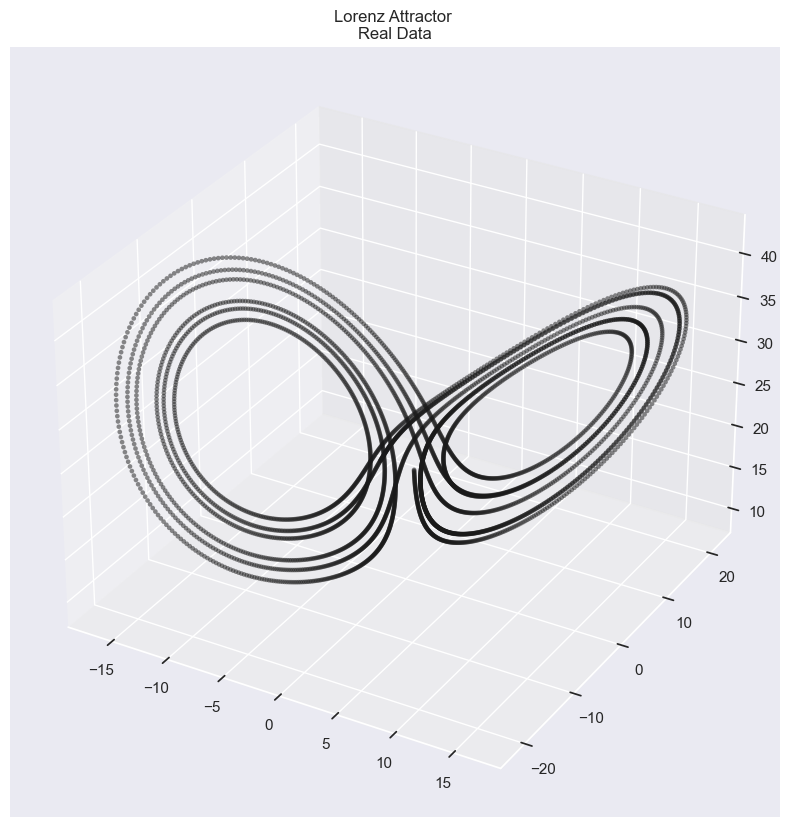

In [146]:
visualize(real=data,save='real',title='Real Data')

In [147]:
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        # Initialize hidden state with zeros
        h0 = torch.zeros(1, x.size(0), self.lstm.hidden_size).to(x.device)
        c0 = torch.zeros(1, x.size(0), self.lstm.hidden_size).to(x.device)

        # Forward pass through LSTM layer
        out, _ = self.lstm(x, (h0, c0))

        # Reshape output for the fully connected layer
        out = out[:, -1, :]

        # Fully connected layer
        out = self.fc(out)

        return out

# Define input size, hidden size, and output size
input_size = 3
hidden_size = 512
output_size = 3

# Create an instance of the LSTMModel
model = LSTMModel(input_size, hidden_size, output_size)

# Define loss function and optimizer
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters())

In [148]:
def get_batch(true_y, batch_size):
    num_samples = len(true_y)
    indices = np.random.choice(np.arange(num_samples - batch_size, dtype=np.int64), size=batch_size, replace=False)
    indices.sort()
    batch_y0 = true_y[indices]  # (batch_size, D)  # (batch_size)
    batch_y = torch.stack([true_y[indices + batch_size-1]])  # (batch_size, M, D)
    return batch_y0, batch_y.squeeze(0).squeeze(1)

In [149]:
predicted_lorenz = model(x)

In [150]:
predicted_lorenz.squeeze(0).shape

torch.Size([50, 3])

In [151]:
x,y = get_batch(data, batch_size=50)

In [152]:
y.shape

torch.Size([50, 3])

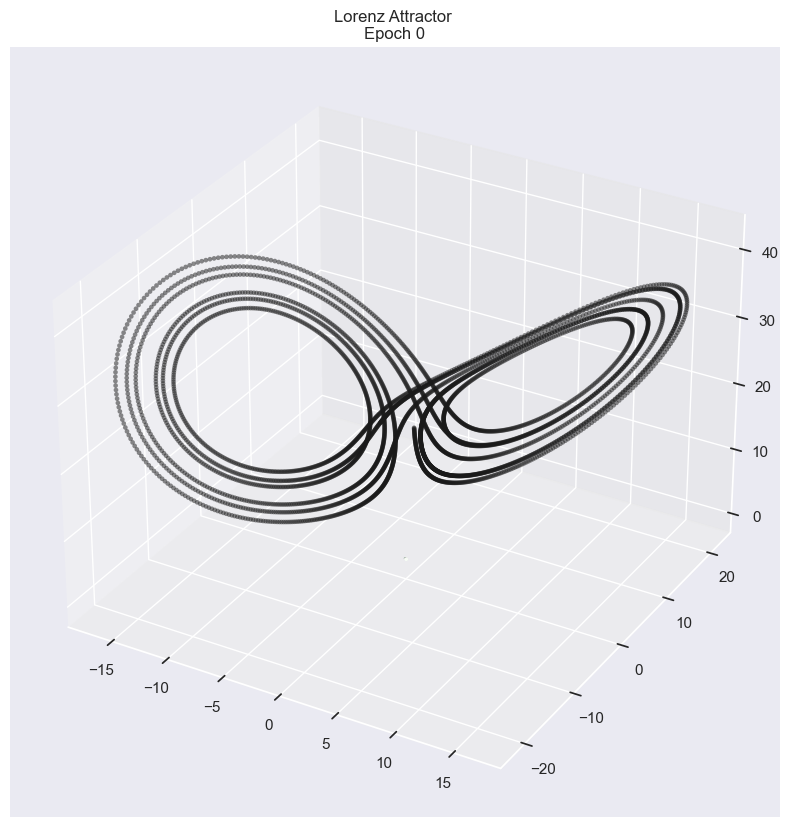

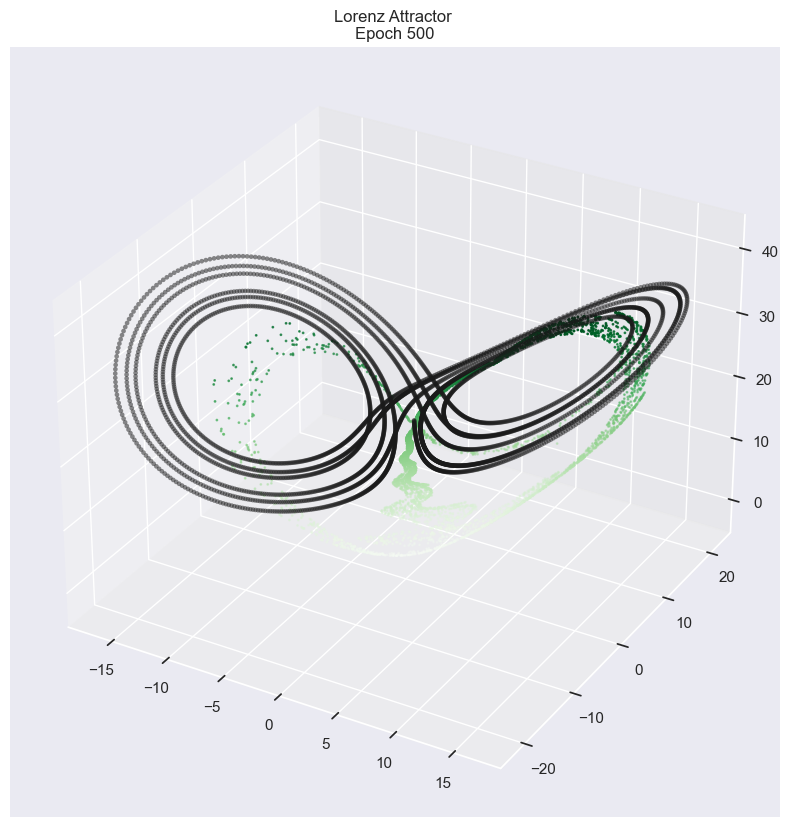

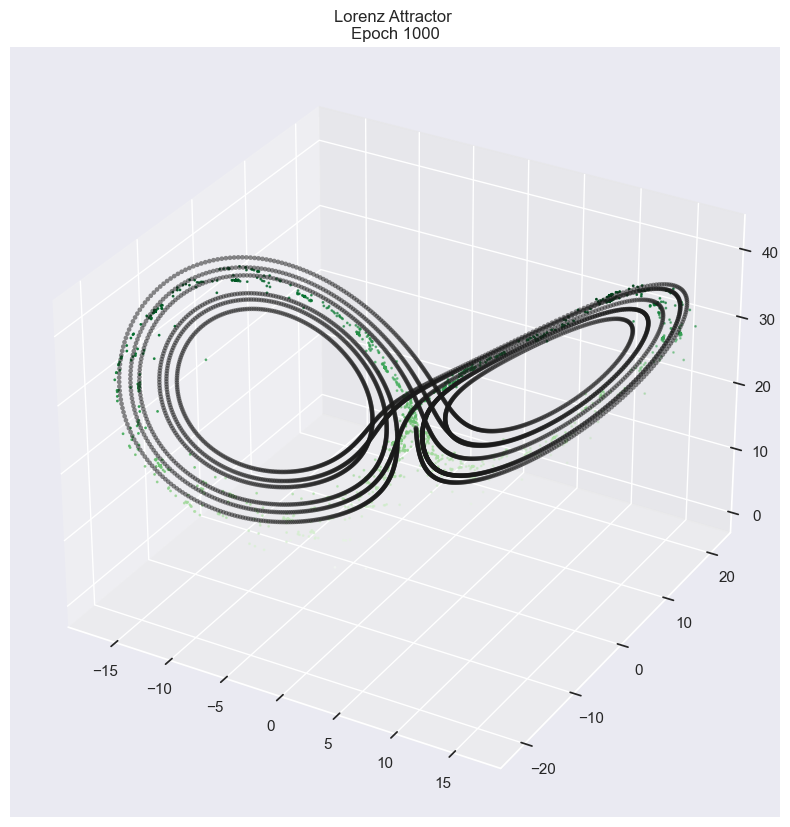

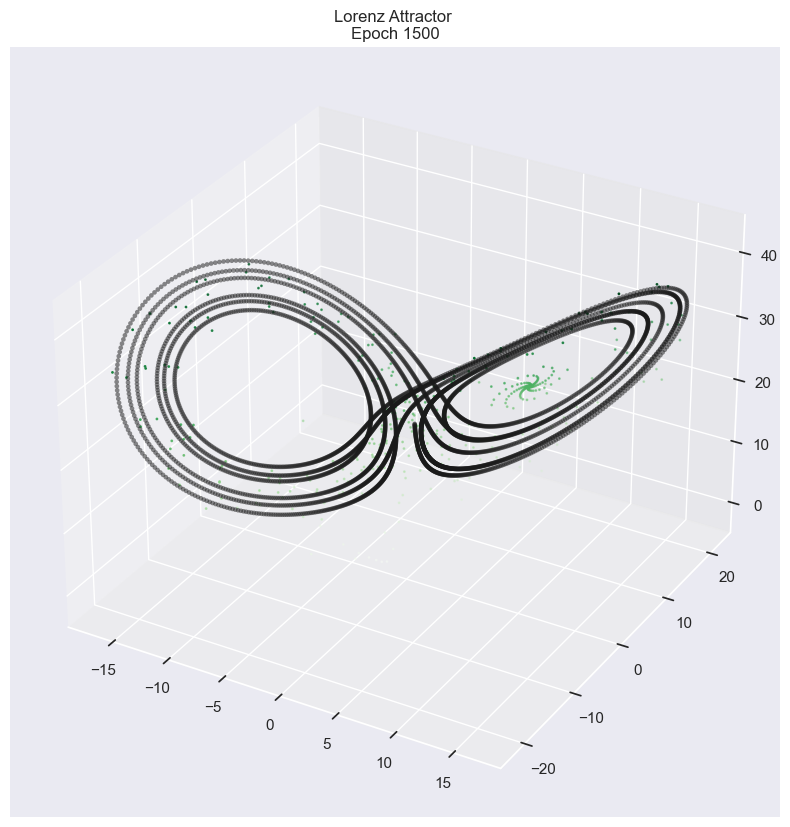

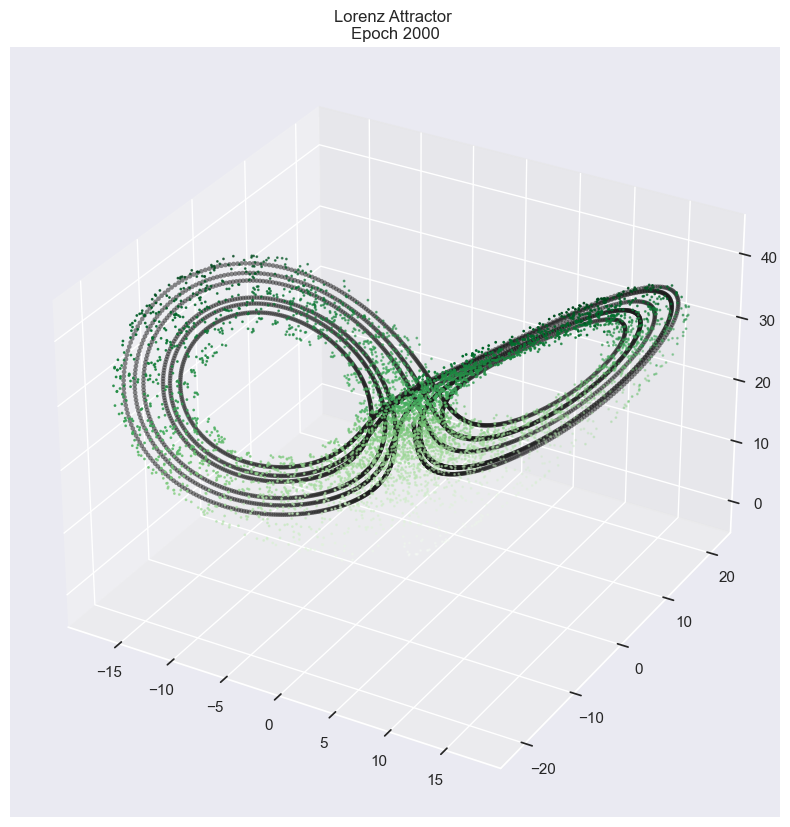

...

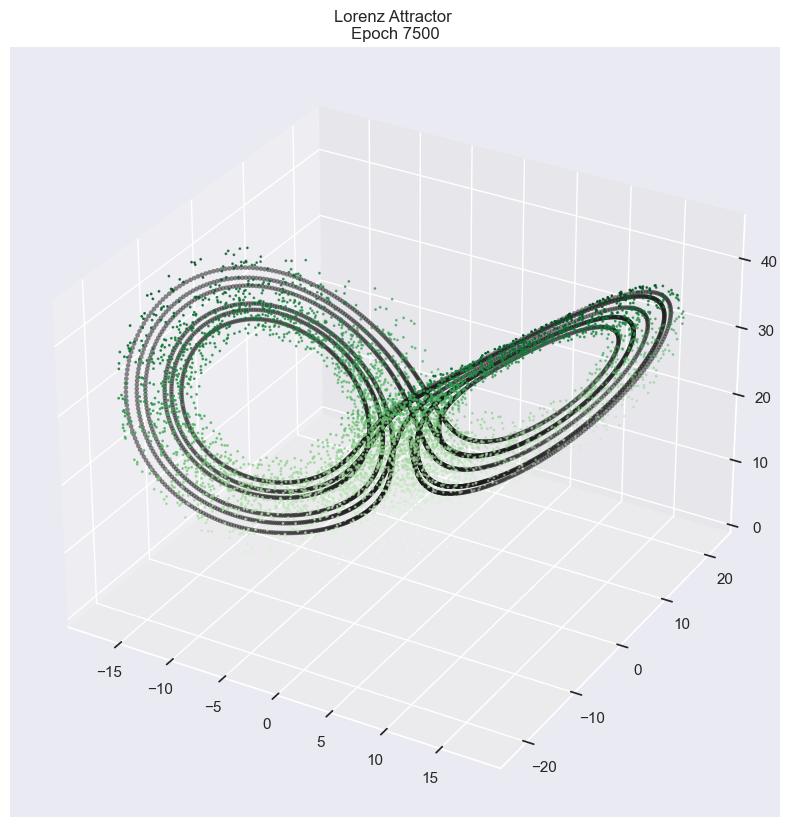

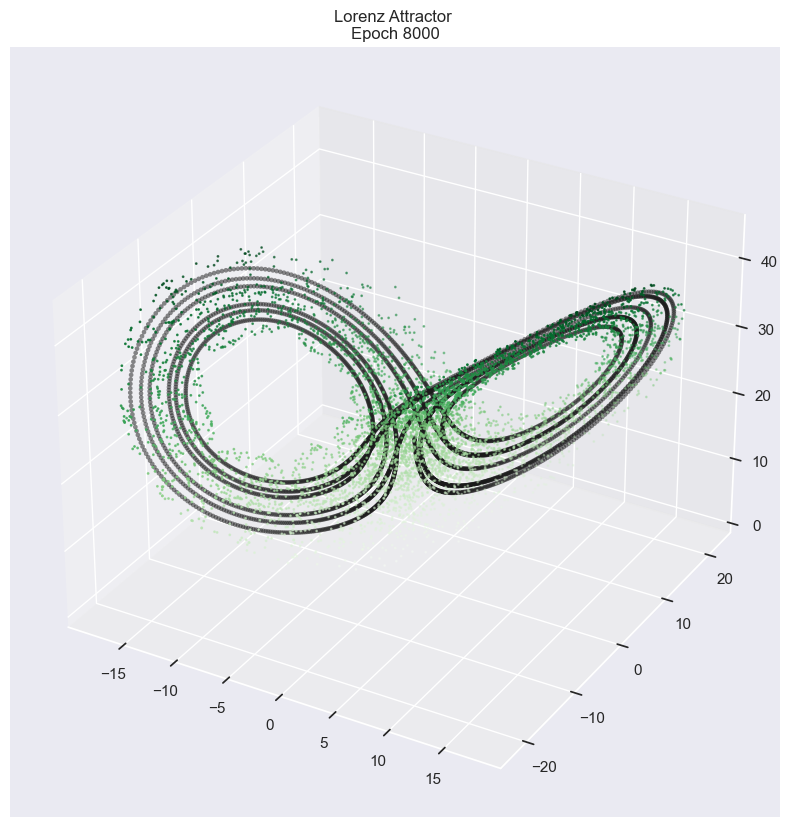

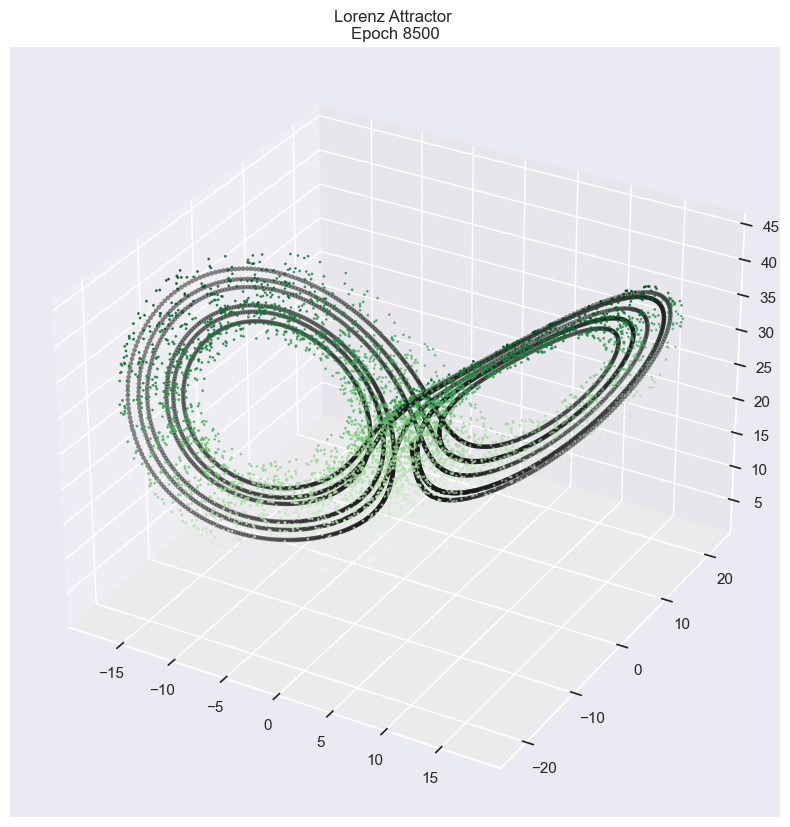

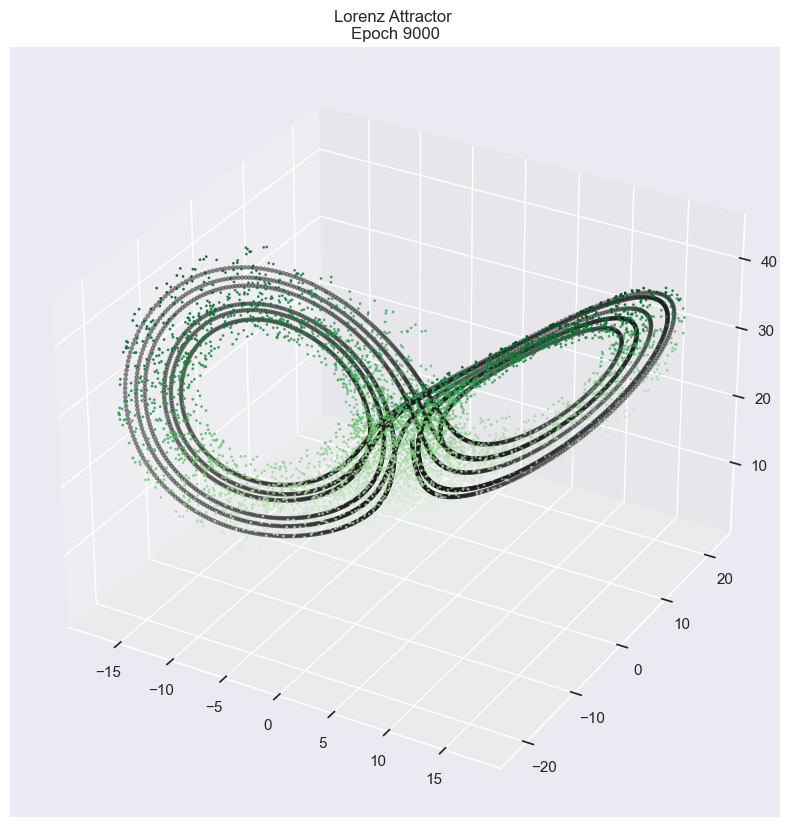

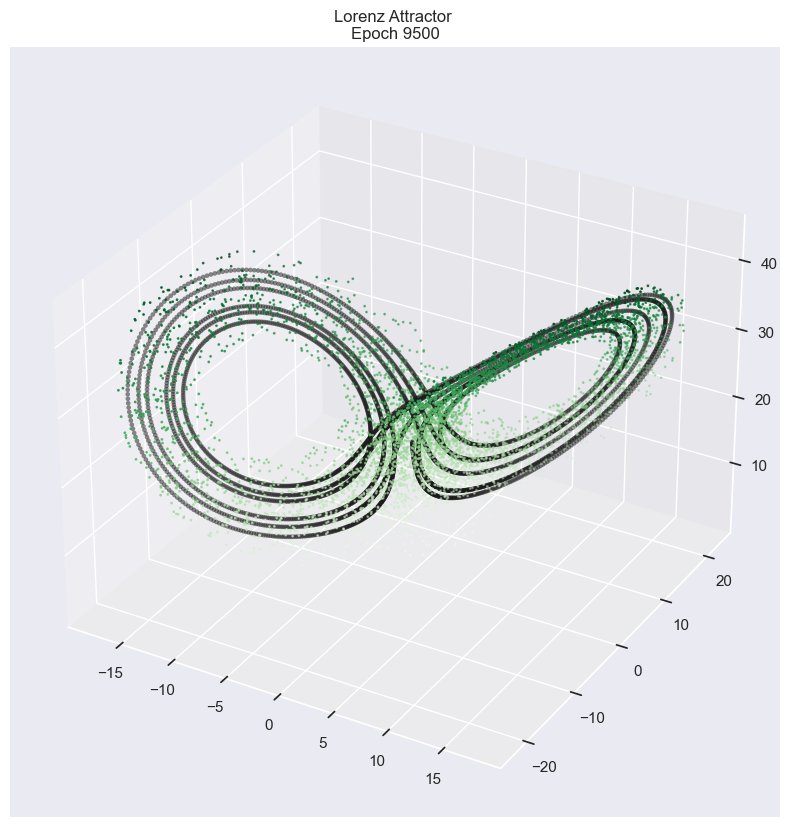

In [153]:
num_epochs = 10000
for epoch in range(num_epochs):
    optimizer.zero_grad()
    x,y = get_batch(data, batch_size=50)
    # Forward pass
    predicted_lorenz = model(x)

    # Compute the loss
    loss = criterion(predicted_lorenz, y)

    # Backpropagation
    loss.backward()
    optimizer.step()

    if epoch % 500 == 0:
        
        predictions = []
        with torch.no_grad():
            input_seq = data[0]
            for i in range(5000):
                output = model(input_seq.unsqueeze(0))
                predictions.append(output)
                input_seq = output
        predictions = torch.stack(predictions)
        loss = F.mse_loss(predictions, data)
        visualize(real=data, 
                             train=predictions,save='PNG/LSTM/{}'.format(epoch),title='Epoch {}'.format(epoch))
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')
        clear_output(wait=True)

In [154]:
predictions = []
with torch.no_grad():
            input_seq = data[0]
            for i in range(5000):
                output = model(input_seq.unsqueeze(0))
                predictions.append(output)
                if i % 1== 0:
                    input_seq = data[i]
                else:
                    input_seq = output
                
            predictions = torch.stack(predictions)

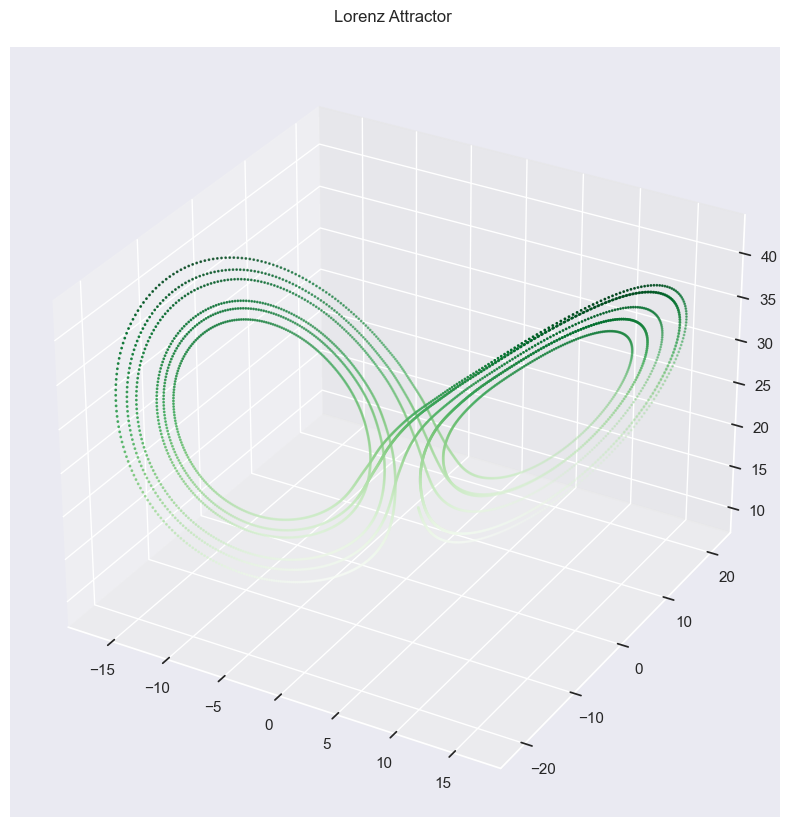

In [155]:
visualize(train=predictions)

In [156]:
x_pred = predictions[:,:, 0]
y_pred = predictions[:, :,1]
z_pred = predictions[:, :,2]

In [157]:
x_train = data[:, :, 0]
y_train = data[:, :, 1]
z_train = data[:, :, 2]

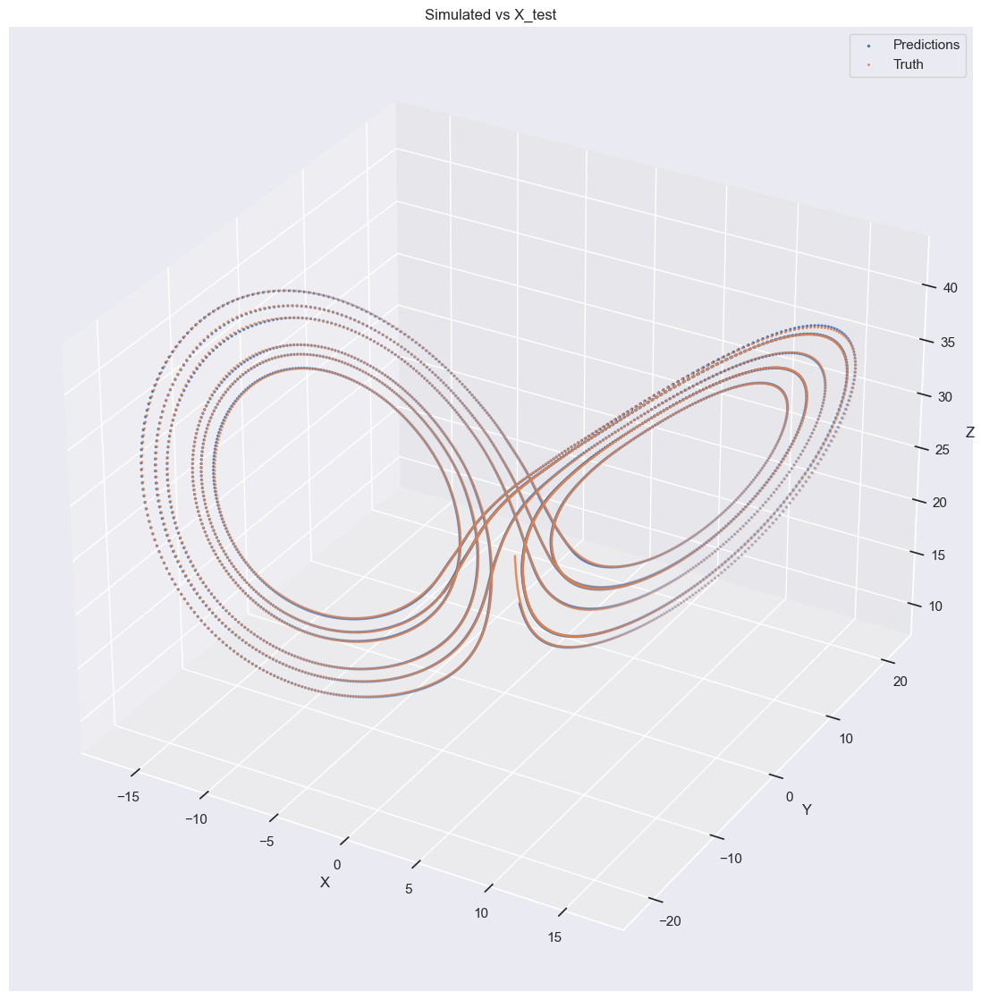

In [158]:
# Create a 3D plot
fig = plt.figure(figsize=(14,14))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x_pred, y_pred, z_pred, label='Predictions',s=2)
ax.scatter(x_train, y_train, z_train, label='Truth',s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Simulated vs X_test')
ax.legend()

# Show the plot
plt.show()

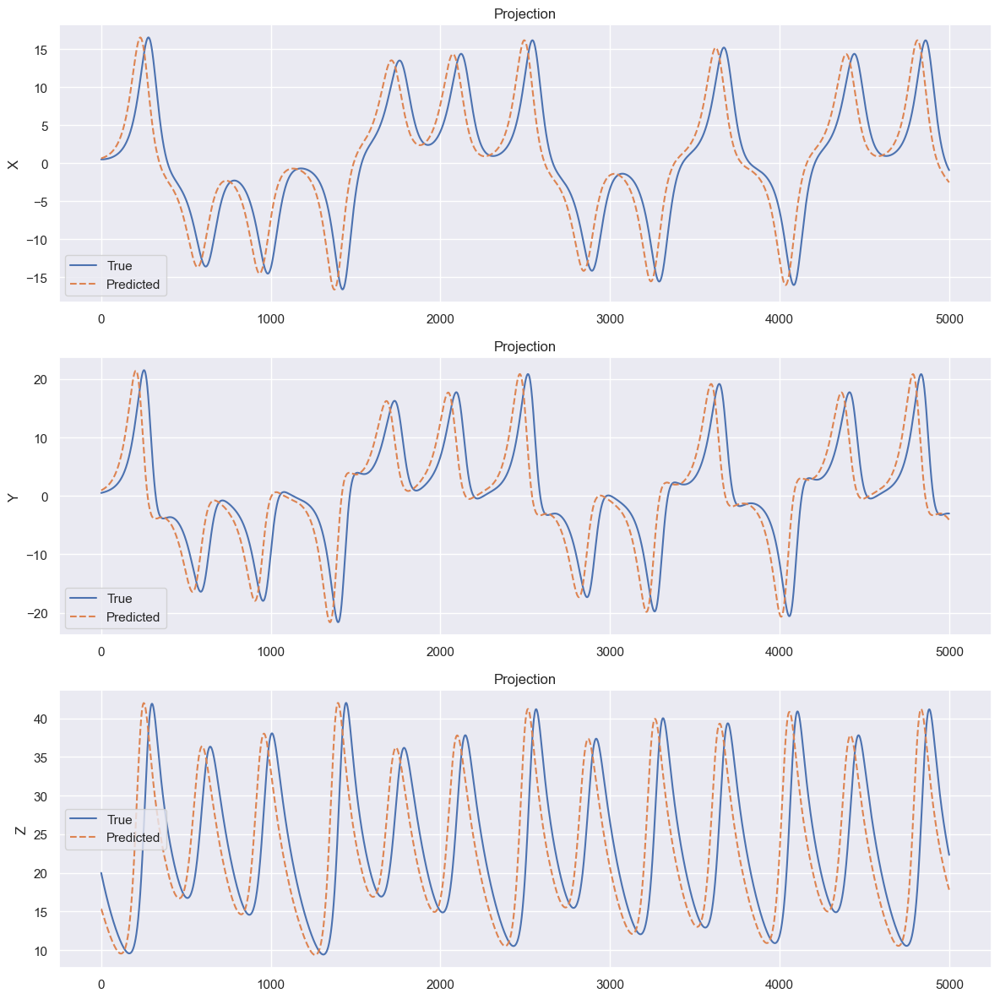

In [159]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted',linestyle='--')

ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 1000)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [160]:
predictions = []
with torch.no_grad():
            input_seq = data[0]
            for i in range(5000):
                output = model(input_seq.unsqueeze(0))
                predictions.append(output)
                input_seq = output
                
            predictions = torch.stack(predictions)

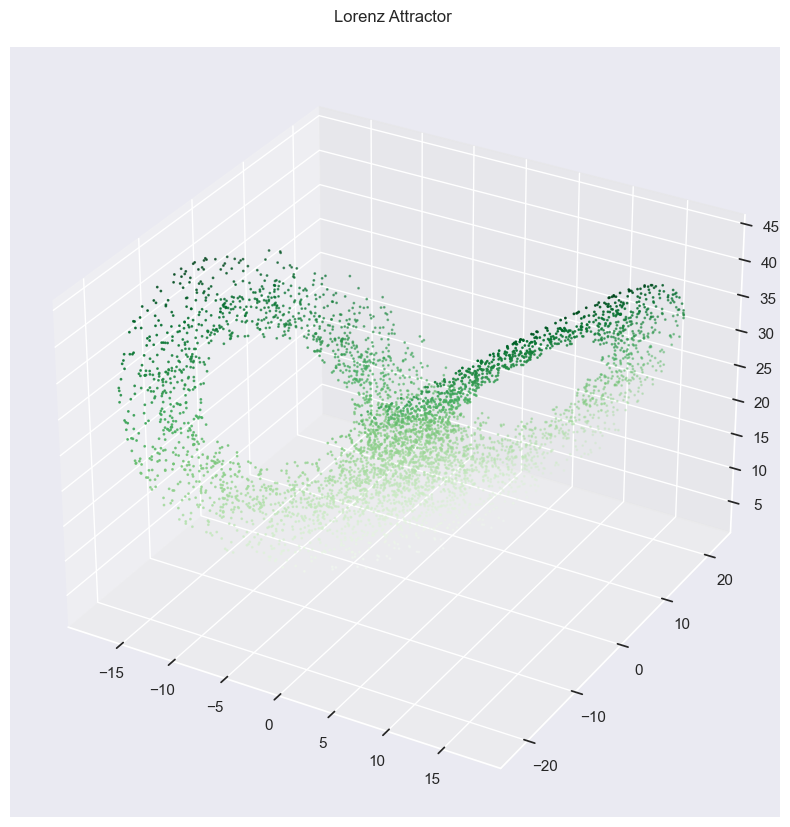

In [161]:
visualize(train=predictions)

In [162]:
x_pred = predictions[:,:, 0]
y_pred = predictions[:, :,1]
z_pred = predictions[:, :,2]

In [163]:
x_train = data[:, :, 0]
y_train = data[:, :, 1]
z_train = data[:, :, 2]

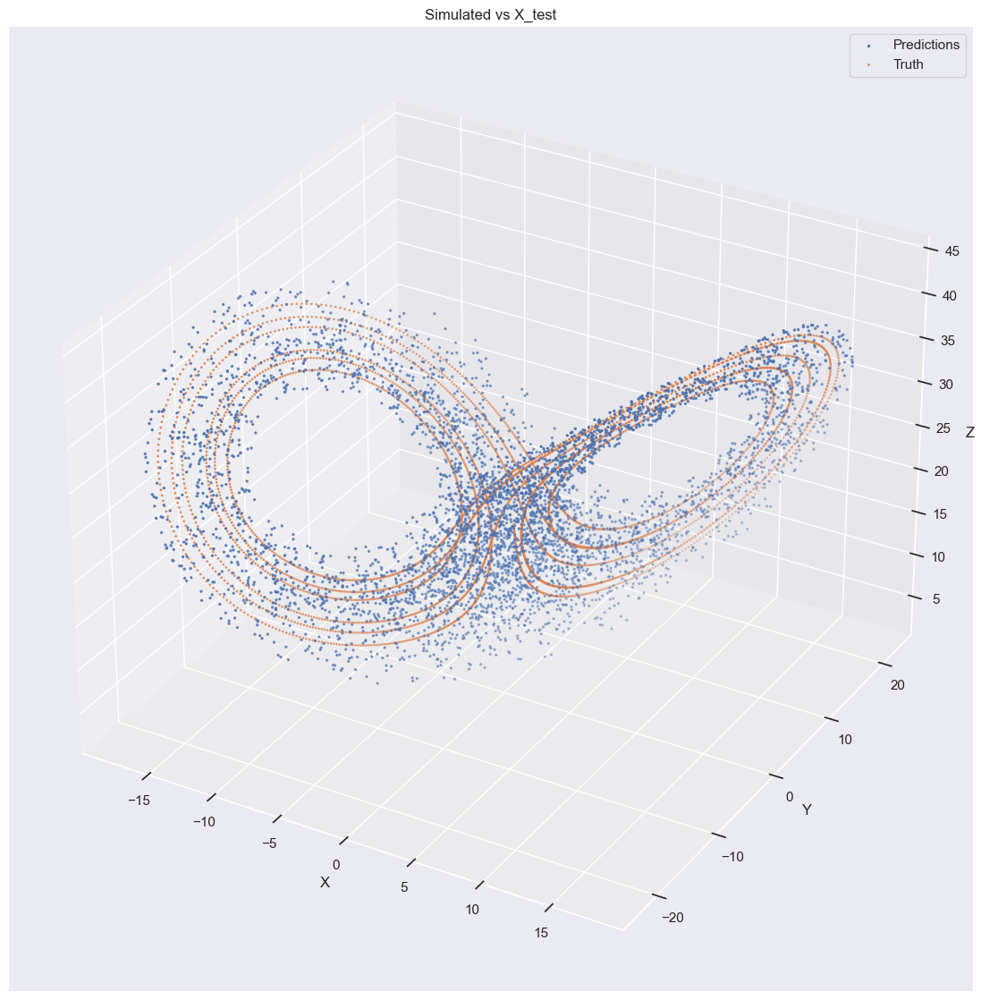

In [164]:
# Create a 3D plot
fig = plt.figure(figsize=(14,14))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x_pred, y_pred, z_pred, label='Predictions',s=2)
ax.scatter(x_train, y_train, z_train, label='Truth',s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Simulated vs X_test')
ax.legend()

# Show the plot
plt.show()

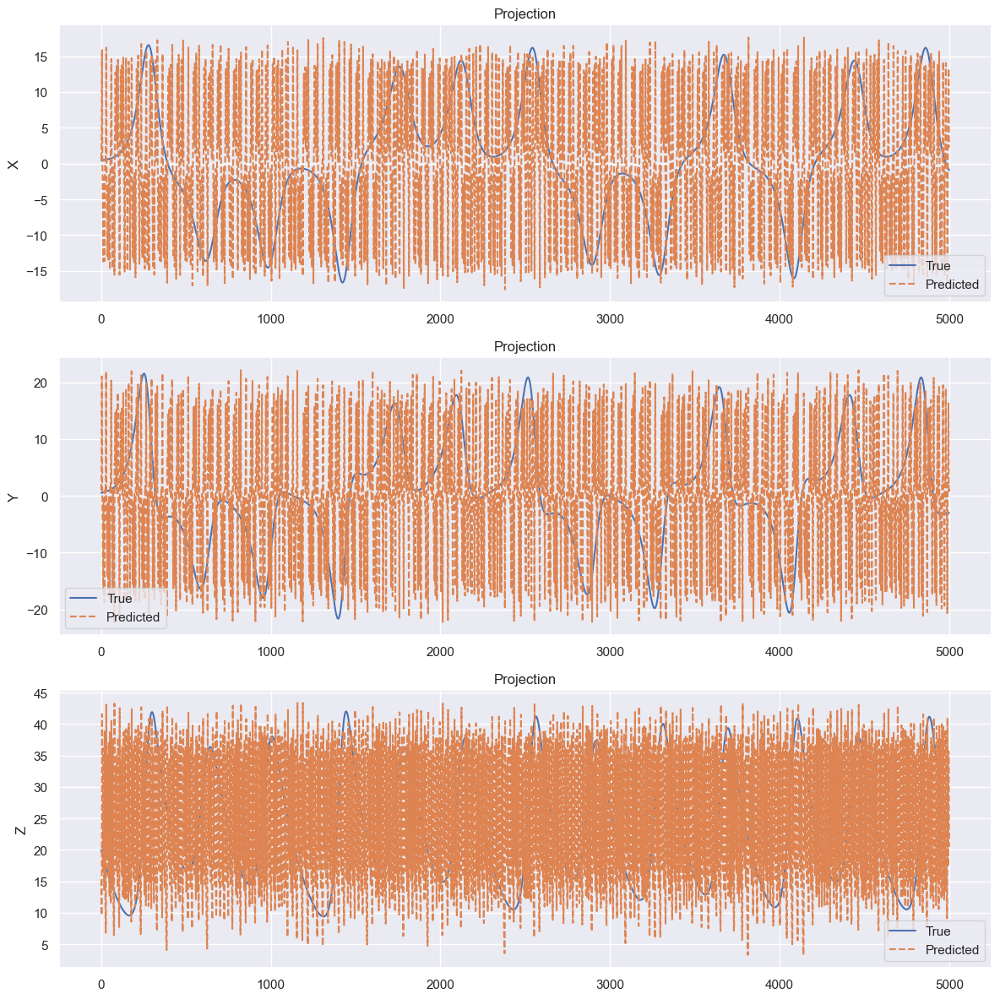

In [165]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted',linestyle='--')

ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 1000)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [166]:
def create_dataset(dataset, lookback):
    """Transform a time series into a prediction dataset
    
    Args:
        dataset: A numpy array of time series, first dimension is the time steps
        lookback: Size of window for prediction
    """
    X, y = [], []
    for i in range(len(dataset)-lookback):
        feature = dataset[i:i+lookback]
        target = dataset[i+1:i+lookback+1]
        X.append(feature)
        y.append(target)
    return torch.tensor(X), torch.tensor(y)
 
lookback = 4
X_train, y_train = create_dataset(data, lookback=lookback)

In [167]:
def create_dataset(dataset, lookback):
    """Transform a time series into a prediction dataset
    
    Args:
        dataset: A numpy array of time series, first dimension is the time steps
        lookback: Size of window for prediction
    """
    X, y = [], []
    for i in range(len(dataset)-lookback):
        feature = dataset[i:i+lookback]
        target = dataset[i+1:i+lookback+1]
        X.append(feature)
        y.append(target)
    return X,y
 
lookback = 4
X_train, y_train = create_dataset(data, lookback=lookback)

In [168]:
X_train

[tensor([[[ 0.5000,  0.5000, 20.0000]],
 
         [[ 0.5001,  0.5070, 19.8941]],
 
         [[ 0.5003,  0.5142, 19.7888]],
 
         [[ 0.5006,  0.5214, 19.6840]]]),
 tensor([[[ 0.5001,  0.5070, 19.8941]],
 
         [[ 0.5003,  0.5142, 19.7888]],
 
         [[ 0.5006,  0.5214, 19.6840]],
 
         [[ 0.5011,  0.5288, 19.5798]]]),
 tensor([[[ 0.5003,  0.5142, 19.7888]],
 
         [[ 0.5006,  0.5214, 19.6840]],
 
         [[ 0.5011,  0.5288, 19.5798]],
 
         [[ 0.5017,  0.5362, 19.4762]]]),
 tensor([[[ 0.5006,  0.5214, 19.6840]],
 
         [[ 0.5011,  0.5288, 19.5798]],
 
         [[ 0.5017,  0.5362, 19.4762]],
 
         [[ 0.5025,  0.5437, 19.3731]]]),
 tensor([[[ 0.5011,  0.5288, 19.5798]],
 
         [[ 0.5017,  0.5362, 19.4762]],
 
         [[ 0.5025,  0.5437, 19.3731]],
 
         [[ 0.5034,  0.5514, 19.2706]]]),
 tensor([[[ 0.5017,  0.5362, 19.4762]],
 
         [[ 0.5025,  0.5437, 19.3731]],
 
         [[ 0.5034,  0.5514, 19.2706]],
 
         [[ 0.5044,  0.5591, 19.16

In [169]:
type(X_train)

list

In [170]:
def create_dataset(dataset, lookback):
    """Transform a time series into a prediction dataset
    
    Args:
        dataset: A numpy array of time series, first dimension is the time steps
        lookback: Size of window for prediction
    """
    X, y = [], []
    for i in range(len(dataset)-lookback):
        feature = dataset[i:i+lookback]
        target = dataset[i+1:i+lookback+1]
        X.append(feature)
        y.append(target)
    return torch.tensor(X), torch.tensor(y)
 
lookback = 4
X_train, y_train = create_dataset(data, lookback=lookback)

In [171]:
def create_dataset(dataset, lookback):
    """Transform a time series into a prediction dataset
    
    Args:
        dataset: A numpy array of time series, first dimension is the time steps
        lookback: Size of window for prediction
    """
    X, y = [], []
    for i in range(len(dataset)-lookback):
        feature = dataset[i:i+lookback]
        target = dataset[i+1:i+lookback+1]
        X.append(feature)
        y.append(target)
    return torch.stack(X), torch.stack(y)
 
lookback = 4
X_train, y_train = create_dataset(data, lookback=lookback)

In [172]:
X_train.shape

torch.Size([4996, 4, 1, 3])

In [173]:
X_train[0]

tensor([[[ 0.5000,  0.5000, 20.0000]],

        [[ 0.5001,  0.5070, 19.8941]],

        [[ 0.5003,  0.5142, 19.7888]],

        [[ 0.5006,  0.5214, 19.6840]]])

In [174]:
X_train[1]

tensor([[[ 0.5001,  0.5070, 19.8941]],

        [[ 0.5003,  0.5142, 19.7888]],

        [[ 0.5006,  0.5214, 19.6840]],

        [[ 0.5011,  0.5288, 19.5798]]])

In [175]:
X_train[0]

tensor([[[ 0.5000,  0.5000, 20.0000]],

        [[ 0.5001,  0.5070, 19.8941]],

        [[ 0.5003,  0.5142, 19.7888]],

        [[ 0.5006,  0.5214, 19.6840]]])

In [176]:
X_train[1]

tensor([[[ 0.5001,  0.5070, 19.8941]],

        [[ 0.5003,  0.5142, 19.7888]],

        [[ 0.5006,  0.5214, 19.6840]],

        [[ 0.5011,  0.5288, 19.5798]]])

In [177]:
y_train.shape

torch.Size([4996, 4, 1, 3])

In [178]:
y_train[1]

tensor([[[ 0.5003,  0.5142, 19.7888]],

        [[ 0.5006,  0.5214, 19.6840]],

        [[ 0.5011,  0.5288, 19.5798]],

        [[ 0.5017,  0.5362, 19.4762]]])

In [179]:
X_train[1].shape

torch.Size([4, 1, 3])

In [180]:
v = model(X_train[1])

In [181]:
v.shape

torch.Size([4, 3])

In [182]:
y_train[1].shape

torch.Size([4, 1, 3])

In [183]:
y_train[1].squeeze(1).shape

torch.Size([4, 3])

In [184]:
def create_dataset(dataset, lookback):
    """Transform a time series into a prediction dataset
    
    Args:
        dataset: A numpy array of time series, first dimension is the time steps
        lookback: Size of window for prediction
    """
    X, y = [], []
    for i in range(len(dataset)-lookback):
        feature = dataset[i:i+lookback]
        target = dataset[i+1:i+lookback+1]
        X.append(feature)
        y.append(target)
    return torch.stack(X), torch.stack(y).squeeze(1)
 
lookback = 4
X_train, y_train = create_dataset(data, lookback=lookback)

In [185]:
loader = data.DataLoader(data.TensorDataset(X_train, y_train), shuffle=True, batch_size=8)

In [186]:
import torch.utils.data as data

In [187]:
loader = data.DataLoader(data.TensorDataset(X_train, y_train), shuffle=True, batch_size=8)

In [188]:
num_epochs = 10000
for epoch in range(num_epochs):
    optimizer.zero_grad()
    for x,y in loader:
        # Forward pass
        predicted_lorenz = model(x)

        # Compute the loss
        loss = criterion(predicted_lorenz, y)

        # Backpropagation
        loss.backward()
        optimizer.step()

        if epoch % 500 == 0:
            
            predictions = []
            with torch.no_grad():
                input_seq = data[0]
                for i in range(5000):
                    output = model(input_seq.unsqueeze(0))
                    predictions.append(output)
                    input_seq = output
            predictions = torch.stack(predictions)
            loss = F.mse_loss(predictions, data)
            visualize(real=data, 
                                train=predictions,save='PNG/LSTM/{}'.format(epoch),title='Epoch {}'.format(epoch))
            print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')
            clear_output(wait=True)

In [189]:
for x,y in loader:
    print(x.shape)
    print(x)
    print(y.shape)
    print(y)
    break

In [190]:
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        # Initialize hidden state with zeros
        h0 = torch.zeros(1, x.size(0), self.lstm.hidden_size).to(x.device)
        c0 = torch.zeros(1, x.size(0), self.lstm.hidden_size).to(x.device)

        # Forward pass through LSTM layer
        out, _ = self.lstm(x)

        # Reshape output for the fully connected layer
        #out = out[:, -1, :]

        # Fully connected layer
        out = self.fc(out)

        return out

# Define input size, hidden size, and output size
input_size = 3
hidden_size = 512
output_size = 3

# Create an instance of the LSTMModel
model = LSTMModel(input_size, hidden_size, output_size)

# Define loss function and optimizer
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters())

In [191]:
def create_dataset(dataset, lookback):
    """Transform a time series into a prediction dataset
    
    Args:
        dataset: A numpy array of time series, first dimension is the time steps
        lookback: Size of window for prediction
    """
    X, y = [], []
    for i in range(len(dataset)-lookback):
        feature = dataset[i:i+lookback]
        target = dataset[i+1:i+lookback+1]
        X.append(feature)
        y.append(target)
    return torch.stack(X), torch.stack(y).squeeze(1)
 
lookback = 4
X_train, y_train = create_dataset(data, lookback=lookback)

In [192]:
for x,y in loader:
    print(x.shape)
    print(x)
    print(y.shape)
    print(y)
    break

In [193]:
num_epochs = 10000
for epoch in range(num_epochs):
    optimizer.zero_grad()
    for x,y in loader:
        # Forward pass
        predicted_lorenz = model(x)

        # Compute the loss
        loss = criterion(predicted_lorenz, y)

        # Backpropagation
        loss.backward()
        optimizer.step()

        if epoch % 500 == 0:
            
            predictions = []
            with torch.no_grad():
                input_seq = data[0]
                for i in range(5000):
                    output = model(input_seq.unsqueeze(0))
                    predictions.append(output)
                    input_seq = output
            predictions = torch.stack(predictions)
            loss = F.mse_loss(predictions, data)
            visualize(real=data, 
                                train=predictions,save='PNG/LSTM/{}'.format(epoch),title='Epoch {}'.format(epoch))
            print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')
            clear_output(wait=True)

In [194]:
import wandb

In [195]:
wandb.login()

True

In [196]:
wandb.init(project="lorenz_lstm", group="Lorenz",save_code=True,notes="Lorenz LSTM run and evaluation")